<a href="https://colab.research.google.com/github/yuricasilvanadeassiscaetano120713-beep/MachineLearningCodes/blob/main/Class_ML%26KNN%26KMeans%26LoR%26LiR%26LNN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
a=np.array([[1,2],[3,4]])
print(a)

In [ ]:
a=np.array(['a','b','s','f','t','r','e',])
print(a
)

In [ ]:
import pandas as pd
pd.Series(a)

In [ ]:
data={'cricketers':['sachin','rohit','panday','Modi'],'scores':[100,80,60,51]}
print(data)
data

In [ ]:
pd.DataFrame(data)

In [ ]:
np.random.randn(5,8)

In [ ]:
data=pd.DataFrame(np.random.randn(5,3))
data
# x= np.random.randn(10)
# print(x)

In [ ]:
data=pd.DataFrame(np.random.randn(5,3), index=['a','c','d','f','h'], columns=['one','two','three'])
data

In [ ]:
data=data.reindex(['a','b','c','d','e','f','g','h'],)
data

In [ ]:
data['three'].isnull()

In [ ]:
clean=data.dropna()
print(clean,"\n\n")

print(data)

In [ ]:
data.fillna(data.mean())

In [ ]:
data.fillna(method='pad')

In [ ]:
data.fillna(method='bfill')

In [ ]:
print(
    data.describe())
print(data)

In [ ]:
import numpy as np
import pandas as pd

In [ ]:
#load the dataset
data = pd.read_csv("/content/titanic.csv")

In [ ]:
data.head()

In [ ]:
data.shape

In [ ]:
data.describe()

In [ ]:
data.info()

In [ ]:
data.isnull().sum()

In [ ]:
data = data.drop(columns=['Name','Ticket'])
data.shape

In [ ]:
data.columns

In [ ]:
#Find the percentage of null elements, to decide if it will be worth to work on particular observation
data.isnull().sum()/data.shape[0]*100

In [ ]:
#The machine model can not learn(identify the pattern) with more than 75% of missing values
#In this case, we should remove the particular field/feature
data = data.drop(columns='Cabin')
data.shape

In [ ]:
#If the missing value iis insignificant, we can remove those rows with missing values
#By default the row is specified as axis=0, and column as axis=1
#inplace=true maintains the serie number after drop the specific row
data.dropna(subset=['Embarked'],axis=0,inplace=True)
data.shape

In [ ]:
#If the missing values are 15,20,25%, we should fill those values
data = data.fillna(data.Age.mean())
data.isnull().sum()

In [ ]:
# Sometimes the dataset is too long to download directly, and is safe to import it from the server

Text analysis over Stack Overflow dataset

In [ ]:
!pip install kaggle

In [ ]:
import os
os.environ['KAGGLE_CONFIG_DIR']="/content"

In [ ]:
!kaggle datasets download stackoverflow/stack-overflow-2018-developer-survey

In [ ]:
!unzip /content/stack-overflow-2018-developer-survey.zip

# **KNN**

In [ ]:
#import the basic libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
data = pd.read_csv("/content/survey_results_public.csv")
data.shape

In [ ]:
df = pd.read_csv("/content/survey_results_schema.csv")
df.shape

In [ ]:
df.head()

In [ ]:
df.describe()

In [ ]:
df.info()

In [ ]:
#Count the number of null values in each feature
df.isnull().sum()

In [ ]:
#Count the percentage of null values
df.isnull().sum()/df.shape[0]*100

In [ ]:
data.head()

In [ ]:
data.describe()

In [ ]:
data.info()

In [ ]:
#Count the number of null values in each feature
data.isnull().sum()

In [ ]:
#Count the percentage of null values
data.isnull().sum()/data.shape[0]*100

In [ ]:
#Dropping the columns with more than 75% of missing values
threshold = 0.75
data = data.loc[:, data.isnull().mean() < threshold]
data.shape

In [ ]:
#Deleting the rows in the columns with less than 5% of missing values
threshold = 0.05  # 5%
data = data[data.isnull().mean(axis=1) >= threshold]

In [ ]:
#Fill the columns with (5-75)% of missing values
for col in data.columns[data.isnull().any()]:
    if data[col].dtype in ['float64', 'int64']:
        data[col] = data[col].fillna(data[col].mean())
    else:
        data[col] = data[col].fillna(data[col].mode()[0])

In [ ]:
data.isnull().sum()

In [ ]:
#Draw the pie for the number of people who finds codding as hobby
hobby_counts = data['Hobby'].value_counts()

# Plot the pie chart
plt.figure(figsize=(6, 6))
plt.pie(hobby_counts, labels=hobby_counts.index, autopct='%1.1f%%',
        colors=['lightblue', 'lightgray'], startangle=140)
plt.title("Code as a Hobby")
plt.axis('equal')
plt.show()

In [ ]:
#Determine the no. of people contributing to open source projects
data['OpenSource'].unique()
contributors = data[data['OpenSource'] != 'Never']
no_contributors = contributors.shape[0]

print(f"Number of people contributing to open source: {no_contributors}")

In [ ]:
#Determine the top-20 countries from where the responses are obtained
top_countries = data['Country'].value_counts().head(20)
print(top_countries)

In [ ]:
# Bar chart
plt.figure(figsize=(12, 6))
top_countries.plot(kind='bar', color='gray')
plt.title('Top 20 Countries by Number of Responses')
plt.xlabel('Country')
plt.ylabel('Number of Responses')
plt.xticks(rotation=75)
plt.tight_layout()
plt.show()

In [ ]:
data.columns.tolist()

In [ ]:
#Find the top-15 countries by average salary
data['ConvertedSalary'] = pd.to_numeric(data['ConvertedSalary'], errors='coerce')
clean_data = data.dropna(subset=['ConvertedSalary', 'Country'])

top_salary_countries = (
    clean_data.groupby('Country')['ConvertedSalary']
    .mean()
    .sort_values(ascending=False)
    .head(15)
)

top_salary_df = top_salary_countries.reset_index()
top_salary_df.columns = ['Country', 'AverageSalary']

plt.figure(figsize=(12, 6))
sns.barplot(
    data=top_salary_df,
    x='AverageSalary',
    y='Country',
    palette='viridis'
)
plt.title('Top 15 Countries by Average Salary')
plt.xlabel('Average Salary (USD)')
plt.ylabel('Country')
plt.show()

In [ ]:
#Salary distribution by employment type
df_salary = data[['Country', 'Employment', 'ConvertedSalary']].copy()
df_salary = df_salary[(df_salary['ConvertedSalary'] > 500) & (df_salary['ConvertedSalary'] < 250000)]

# Top 20 countries by average salary
avg_salary_country = df_salary.groupby('Country')['ConvertedSalary'].mean().sort_values(ascending=False).head(20)

# Boxplot: Salary distribution by employment type
plt.figure(figsize=(12, 6))
sns.boxplot(x='Employment', y='ConvertedSalary', data=df_salary)
plt.ylim(0, 200000)
plt.xticks(rotation=45)
plt.title('Salary Distribution by Employment Type')
plt.xlabel('Employment Type')
plt.ylabel('Converted Salary (USD)')
plt.tight_layout()
plt.show()

# Do the same analysis that we did till now
#Count the number of null values in each feature
#Count the percentage of null values
#Draw the pie for the number of people who finds codding as hobby
#Determine the no. of people contributing to open source projects
#// the top-20 countries from where the responses are obtained
#Do other 5 analysis as per your own thinking

# **K Means**

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

In [ ]:
#classification of flowers, there are 3 categorias disso, com 4 parametros( petal,sepal, ,)
col_names=["sepallength", "sepalwidth", "petallength", "petalwidth", "class"]
url="https://archive.ics.uci.edu/ml/machine-learning-databases/iris/iris.data"
dataset = pd.read_csv(url,names=col_names)

In [ ]:
dataset

In [ ]:
dataset_knn=dataset.values[:,0:4] #which is 0,1,2,3 columns and all the rows
labels=dataset.values[:,-1]

In [ ]:
dataset_knn

In [ ]:
import math
def distance(x1,x2):
  distances=0.0
  for i in range(len(x1)):
    distances+=(x1[i]-x2[i])**2
  return(math.sqrt(distances))

In [ ]:
testing_data=dataset.values[101,0:4] #here Icould also check [0:49,0:2]

In [ ]:
distance_cumm=[]
for i in range(len(dataset_knn)):
  distance_cumm.append([distance(dataset_knn[i],testing_data),labels[i]])

In [ ]:
distance_cumm

In [ ]:
distance_cumm.sort()

In [ ]:
distance_cumm

In [ ]:
k=7
label_topk=[]
for i in range(1,k+1):
  label_topk.append(distance_cumm[i][1])


In [ ]:
label_topk

In [ ]:
from collections import Counter
count=Counter(label_topk)

In [ ]:
count

In [ ]:
count.most_common(1)

In [ ]:
count.most_common(1)[0]

In [ ]:
print("Our final count is: ",count.most_common(1)[0][0])#this 1 comes from top 1 elements more repeated

In [ ]:
#fetch first k observation and label it
ob1=ob2=ob3=0
for i in range(150):
  if distance_cumm[i][1]=='Iris-setosa':
    ob1+=1
  elif distance_cumm[i][1]=='Iris-versicolor':
    ob2+=1
  elif distance_cumm[i][1]=='Iris-virginica':
    ob3+=1

if(ob1>ob2):
  if ob1>ob3:
    print("Iris-setosa")
  else:
      print("Iris-virginica")
else:
  if ob2>ob3:
    print("Iris-versicolor")
  else:
    print("Iris-virginica")


print(ob1," ", ob2," ",ob3)

# **Cluster Hierarchy**

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

In [ ]:
dataset= pd.read_csv("/content/KMeans.csv")

In [ ]:
dataset

,Age,Annual Income (k$),Spending Score (1-100)
0,19,15,39
1,21,15,81
2,20,16,6
3,23,16,77
4,31,17,40
...,...,...,...
195,35,120,79
196,45,126,28
197,32,126,74
198,32,137,18


In [ ]:
x=dataset.iloc[:,[1,2]].values

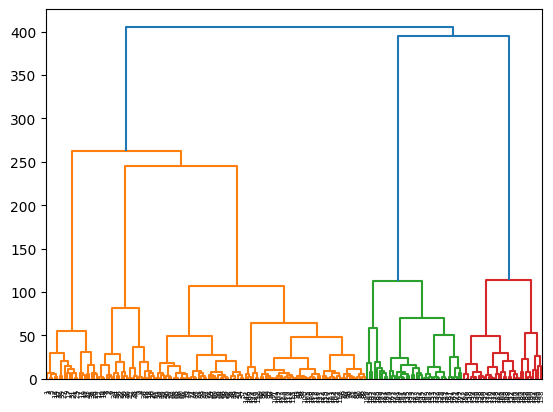

In [ ]:
import scipy.cluster.hierarchy as sch
dendrogram=sch.dendrogram(sch.linkage(x, method="ward"))
plt.show()

In [ ]:
from sklearn.cluster import AgglomerativeClustering
hc = AgglomerativeClustering(n_clusters=5, linkage="ward")
yhc = hc.fit_predict(x)

In [ ]:
yhc

array([4, 3, 4, 3, 4, 3, 4, 3, 4, 3, 4, 3, 4, 3, 4, 3, 4, 3, 4, 3, 4, 3,
       4, 3, 4, 3, 4, 3, 4, 3, 4, 3, 4, 3, 4, 3, 4, 3, 4, 3, 4, 3, 4, 1,
       4, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 2, 1, 2, 0, 2, 0, 2,
       1, 2, 0, 2, 0, 2, 0, 2, 0, 2, 1, 2, 0, 2, 1, 2, 0, 2, 0, 2, 0, 2,
       0, 2, 0, 2, 0, 2, 1, 2, 0, 2, 0, 2, 0, 2, 0, 2, 0, 2, 0, 2, 0, 2,
       0, 2, 0, 2, 0, 2, 0, 2, 0, 2, 0, 2, 0, 2, 0, 2, 0, 2, 0, 2, 0, 2,
       0, 2])

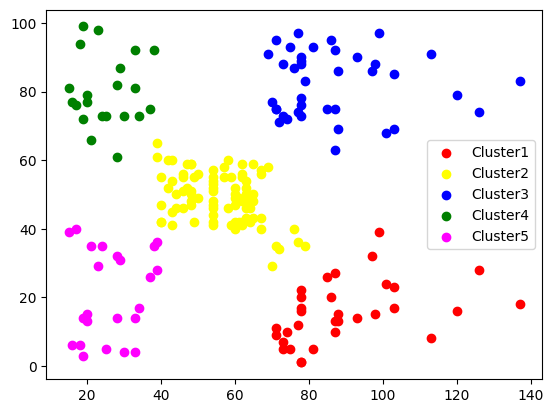

In [ ]:
#plot the clusters
plt.scatter(x[yhc==0,0],x[yhc==0,1],c='red',label='Cluster1')
plt.scatter(x[yhc==1,0],x[yhc==1,1],c='yellow',label='Cluster2')
plt.scatter(x[yhc==2,0],x[yhc==2,1],c='blue',label='Cluster3')
plt.scatter(x[yhc==3,0],x[yhc==3,1],c='green',label='Cluster4')
plt.scatter(x[yhc==4,0],x[yhc==4,1],c='magenta',label='Cluster5')

plt.legend()

DBSCAN

In [ ]:
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import StandardScaler

In [ ]:
x = StandardScaler().fit_transform(x)

In [ ]:
db=DBSCAN(eps=0.3,min_samples=6).fit(x)

In [ ]:
db.labels_ #so we have 10 clusters, from -1 to 8 if min_samples=3. If it's equal to 5 then min_samples is 8. if eps=0.05 and min_samples=5, then everything will be -1. if eps=0.05 and min_samples=1, then the numbers will go from 0 to 169

array([ 1,  0, -1,  0,  1,  0, -1, -1, -1,  0, -1, -1, -1,  0, -1,  0,  1,
        0,  1, -1,  1,  0, -1,  0, -1, -1,  1, -1, -1, -1, -1,  0, -1, -1,
       -1, -1, -1, -1, -1, -1,  2, -1,  2,  2, -1,  2,  2,  2,  2,  2,  2,
        2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,
        2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,
        2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,
        2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,
        2,  2,  2,  2,  3,  2,  3,  2,  3,  4,  3,  4,  3,  2,  3,  4,  3,
        4,  3,  4,  3,  4,  3,  2,  3,  4,  3,  2,  3,  4,  3,  4,  3,  4,
        3,  4,  3,  4,  3,  4,  3,  2,  3,  4,  3,  5,  3,  5,  3,  5, -1,
        5,  3,  5,  3,  5, -1,  5,  3,  5, -1, -1, -1,  5, -1, -1, -1, -1,
       -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1])

In [ ]:
#noise points are -1
db.core_sample_indices_

array([  3,   5,   9,  13,  15,  16,  21,  46,  47,  48,  49,  50,  51,
        52,  53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,
        65,  66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,
        78,  79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,
        91,  92,  93,  94,  95,  96,  97,  98,  99, 100, 101, 102, 103,
       104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116,
       117, 118, 119, 120, 121, 122, 125, 126, 128, 129, 130, 131, 132,
       133, 134, 135, 136, 137, 138, 139, 140, 141, 143, 144, 147, 149,
       151, 153, 154, 155, 157, 159, 161, 163, 165, 166, 170, 174, 176,
       178])

In [ ]:
len(set(db.labels_))

7

In [ ]:
#Identify the boundary points
#Visualize the points in following categories:
#1. Noise points: as black color
#2. All the cluster points as different color
#2a. Core point size > Boundary point size

# **Logistic regression**

In [ ]:
import pandas as pd
from google.colab import files

# Upload file
uploaded = files.upload()

# Read the CSV (replace with your filename after upload)
dataset = pd.read_csv("diabetes.csv")

# Check data
dataset.head()


Saving diabetes.csv to diabetes.csv


,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1


In [ ]:
import pandas as pd
dataset=pd.read_csv("/content/diabetes.csv")
dataset.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1


In [ ]:
feature_col=['Glucose', 'BloodPressure', 'Insulin','BMI','DiabetesPedigreeFunction','Age']
X=dataset[feature_col]
Y=dataset.Outcome

In [ ]:
#Train-Test Split
from sklearn.model_selection import train_test_split
X_train, X_test, Y_train, Y_test= train_test_split(X,Y,test_size=0.2,random_state=16)#means 20% of the dataset should be going through the test

In [ ]:
#standard scaler
from sklearn.preprocessing import StandardScaler
scaler=StandardScaler()
X_train_scaled= scaler.fit_transform(X_train)
X_test_scaled=scaler.transform(X_test)

In [ ]:
#build the logistic Regression model
from sklearn.linear_model import LogisticRegression

In [ ]:
model=LogisticRegression(max_iter=1000) #in linear refression we dont especify this. so the model will try 1000 times


In [ ]:
model.fit(X_train_scaled,Y_train)

LogisticRegression(max_iter=1000)

In [ ]:
y_pred=model.predict(X_test_scaled )

In [ ]:
y_pred

array([1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1,
       0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1, 1,
       0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0,
       0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1,
       0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1,
       0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0])

In [ ]:
#efficiency or evaluation parameters
from sklearn import metrics

In [ ]:
confusion_matrix = metrics.confusion_matrix(y_pred,Y_test)

In [ ]:
confusion_matrix

array([[91, 21],
       [11, 31]])

In [ ]:
#task for today
#Work over designing(mathematical) model of logistic regression for multi-class classification

# **Linear regression**

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

In [ ]:
colnames=['Area','Rooms','Price']
dataset = pd.read_csv("https://raw.githubusercontent.com/nishithkotak/machine-learning/refs/heads/master/ex1data2.txt", names=colnames)

In [ ]:
dataset

,Area,Rooms,Price
0,2104,3,399900
1,1600,3,329900
2,2400,3,369000
3,1416,2,232000
4,3000,4,539900
5,1985,4,299900
6,1534,3,314900
7,1427,3,198999
8,1380,3,212000
9,1494,3,242500


In [ ]:
dataset.describe()

,Area,Rooms,Price
count,47.000000,47.000000,47.000000
mean,2000.680851,3.170213,340412.659574
std,794.702354,0.760982,125039.899586
min,852.000000,1.000000,169900.000000
25%,1432.000000,3.000000,249900.000000
50%,1888.000000,3.000000,299900.000000
75%,2269.000000,4.000000,384450.000000
max,4478.000000,5.000000,699900.000000


In [ ]:
Area=dataset.iloc[0:dataset.shape[0],0:1]
Rooms=dataset.iloc[0:dataset.shape[0],1:2]
Price=dataset.iloc[0:dataset.shape[0],2:3]

In [ ]:
def feature_normalization(x):
  mean=np.mean(x,axis=0)
  std=np.std(x,axis=0)
  X_normalized=(x-mean)/std
  return X_normalized,mean,std

In [ ]:
data_norm=dataset.values
m=data_norm.shape[0] #Number of observations
#Take the features vectors
x2=data_norm[:,0:2].reshape(m,2)
x2_norm,mean,std=feature_normalization(x2)

y2=data_norm[:,2:3].reshape(m,1) #price column

In [ ]:
 x2_norm

array([[ 1.31415422e-01, -2.26093368e-01],
       [-5.09640698e-01, -2.26093368e-01],
       [ 5.07908699e-01, -2.26093368e-01],
       [-7.43677059e-01, -1.55439190e+00],
       [ 1.27107075e+00,  1.10220517e+00],
       [-1.99450507e-02,  1.10220517e+00],
       [-5.93588523e-01, -2.26093368e-01],
       [-7.29685755e-01, -2.26093368e-01],
       [-7.89466782e-01, -2.26093368e-01],
       [-6.44465993e-01, -2.26093368e-01],
       [-7.71822042e-02,  1.10220517e+00],
       [-8.65999486e-04, -2.26093368e-01],
       [-1.40779041e-01, -2.26093368e-01],
       [ 3.15099326e+00,  2.43050370e+00],
       [-9.31923697e-01, -2.26093368e-01],
       [ 3.80715024e-01,  1.10220517e+00],
       [-8.65782986e-01, -1.55439190e+00],
       [-9.72625673e-01, -2.26093368e-01],
       [ 7.73743478e-01,  1.10220517e+00],
       [ 1.31050078e+00,  1.10220517e+00],
       [-2.97227261e-01, -2.26093368e-01],
       [-1.43322915e-01, -1.55439190e+00],
       [-5.04552951e-01, -2.26093368e-01],
       [-4.

In [ ]:
theta_array = np.zeros((3,1))

In [ ]:
#Linear Regression
def hypothesis(theta_array, x_1,x_2):
  return theta_array[0]+theta_array[1]*x_1+theta_array[2]*x_2

In [ ]:
def cost_function(theta_array,x_1,x_2,y,m):
  errors = 0
  for i in range(m):
    errors+=((theta_array[0]+theta_array[1]*x_1[i]+theta_array[2]*x_2[i])-y[i])*2
  return (1/2*m)*errors

In [ ]:
def gradient_descent(theta_array,x_1,x_2,y,m,alpha):
  error_1 = 0
  error_2 = 0
  error_3 = 0
  for i in range(m):
    error_1 += ((theta_array[0]+theta_array[1]*x_1[i]+theta_array[2]*x_2[i])-y[i])
    error_2 += x_1[i]*((theta_array[0]+theta_array[1]*x_1[i]+theta_array[2]*x_2[i])-y[i])
    error_3 += x_2[i]*((theta_array[0]+theta_array[1]*x_1[i]+theta_array[2]*x_2[i])-y[i])

  new_theta1 = theta_array[0]-(alpha/m)*error_1
  new_theta2 = theta_array[0]-(alpha/m)*error_2
  new_theta3 = theta_array[0]-(alpha/m)*error_3
  updated_new_theta = [new_theta1,new_theta2,new_theta3]
  return updated_new_theta

In [ ]:
def training(x_1,x_2,y,alpha,iters):
  theta1 = 0
  theta2 = 0
  theta3 = 0
  cost_values = []
  theta_array=[theta1,theta2,theta3]
  m=data_norm.shape[0]

  # The gradient descent does the optimization of the training model
  for i in range(iters):
    theta_array = gradient_descent(theta_array,x_1,x_2,y,m,alpha)
    cost_values.append(cost_function(theta_array, x_1,x_2, y, m))
  return cost_values, theta_array

In [ ]:
alpha = 0.01
iters = 50

In [ ]:
cost,theta=training(x2_norm[:,0:1],x2_norm[:,1:2],y2,alpha,iters)

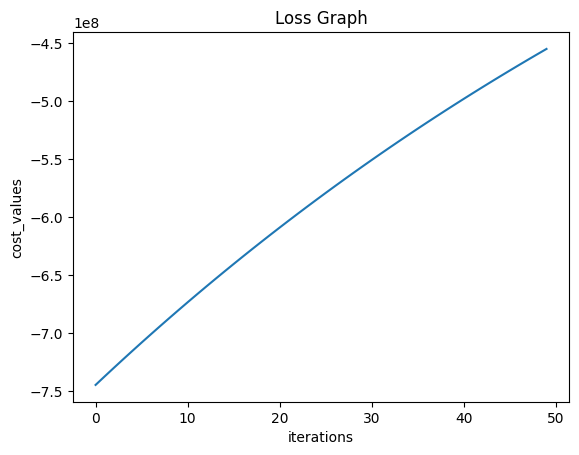

[array([134460.93520149]), array([131423.21504583]), array([130914.89868715])]


In [ ]:
x_axis = np.arange(0, len(cost), step = 1)
plt.plot(x_axis, cost)
plt.xlabel('iterations')
plt.ylabel('cost_values')
plt.title('Loss Graph')
plt.show()

print(theta)

# *Linear Regression One Variable*

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

In [ ]:
from google.colab import files
uploaded = files.upload()
data=pd.read_csv("train (2).csv")

Saving train (2).csv to train (2) (2).csv


In [ ]:
data. describe()

,x,y
count,700.000000,699.000000
mean,54.985939,49.939869
std,134.681703,29.109217
min,0.000000,-3.839981
25%,25.000000,24.929968
50%,49.000000,48.973020
75%,75.000000,74.929911
max,3530.157369,108.871618


In [ ]:
x = data.iloc[0:700,0:1]
y = data.iloc[0:700,1:2]

In [ ]:
x

,x
0,24.0
1,50.0
2,15.0
3,38.0
4,87.0
...,...
695,58.0
696,93.0
697,82.0
698,66.0


<Axes: >

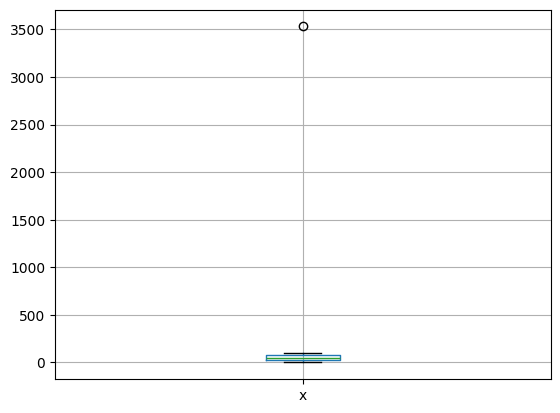

In [ ]:
x.boxplot(column=['x'])

<Axes: >

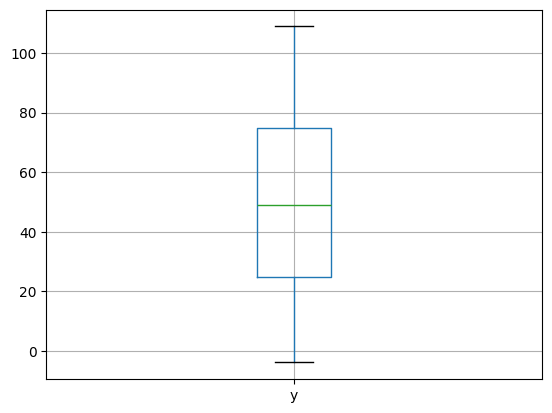

In [ ]:
y.boxplot(column=['y'])

Text(0.5, 1.0, 'X vs Y\xa0scatter\xa0plot')

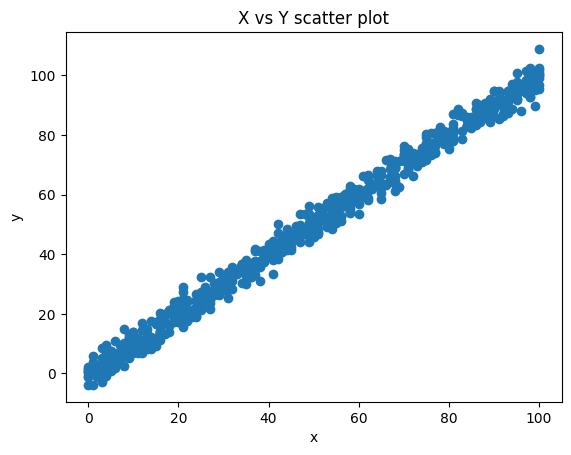

In [ ]:
#Plot the scatter plot
plt.scatter(x,y)
plt.xlabel('x')
plt.ylabel('y')
plt.title("X vs Y scatter plot")

In [ ]:
#Linear Regression
def hypothesis(theta_array, x):
  return theta_array[0]+theta_array[1]*x

In [ ]:
def cost_function(theta_array, x,y,m):
  errors = 0
  for i in range(m):
    errors+=((theta_array[0]+theta_array[1]*x[i])-y[i])**2
  return (1/(2*m))*errors

In [ ]:
#Gradient is the change in values
#Implementing the Gradient descent functions
def gradient_descent(theta_array,x,y,m, alpha):
  error_1 = 0
  error_2 = 0
  for i in range(m):
    error_1 += ((theta_array[0]+theta_array[1]*x[i])-y[i])
    error_2 += x[i]*((theta_array[0]+theta_array[1]*x[i])-y[i])

  new_theta1 = theta_array[0]-(alpha/m)*error_1
  new_theta2 = theta_array[0]-(alpha/m)*error_2
  updated_new_theta = [new_theta1, new_theta2]
  return updated_new_theta

In [ ]:
def training(x,y, alpha, iters):
  theta1 = 0 # Initialize theta1
  theta2 = 0 # Initialize theta2
  cost_values = []
  theta_array=[theta1, theta2]
  m=x.size

  # The gradient descent does the optimization of the training model
  for i in range(iters):
    theta_array = gradient_descent (theta_array,x,y,m,alpha)
    cost_values.append(cost_function(theta_array, x, y, m))
    y_predict = x*theta_array[1]+theta_array[0]
    plt.plot(y_predict, x, 'b')
    plt.scatter(x, y)
    plt.show()
  return cost_values, theta_array

In [ ]:
#Feedind the input data
training_data = data.dropna()

In [ ]:
training_data.shape

(699, 2)

In [ ]:
x_value = training_data['x']
y_value = training_data['y']

In [ ]:
type(x_value)

pandas.core.series.Series

In [ ]:
x_value = x_value.values.reshape(x_value.size)
y_value = y_value.values.reshape(y_value.size)

In [ ]:
type(x_value)

numpy.ndarray

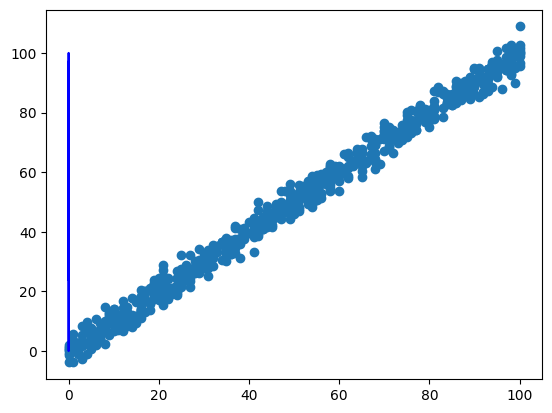

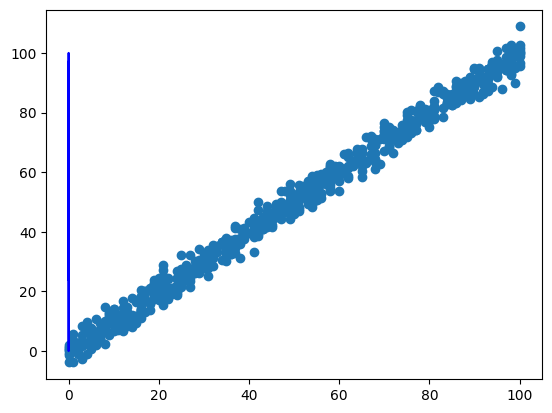

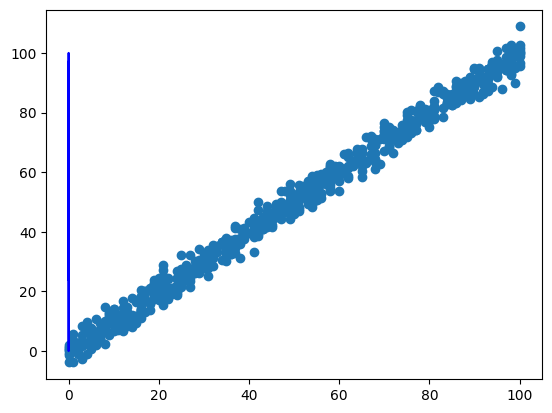

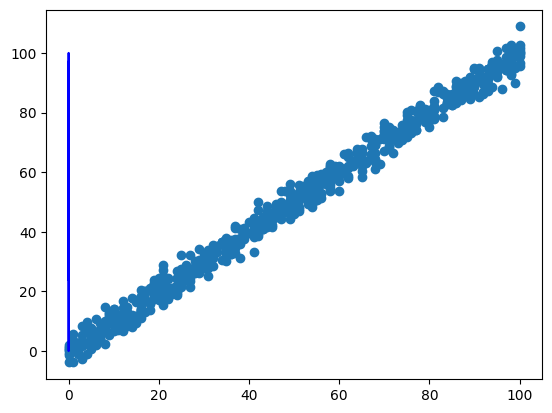

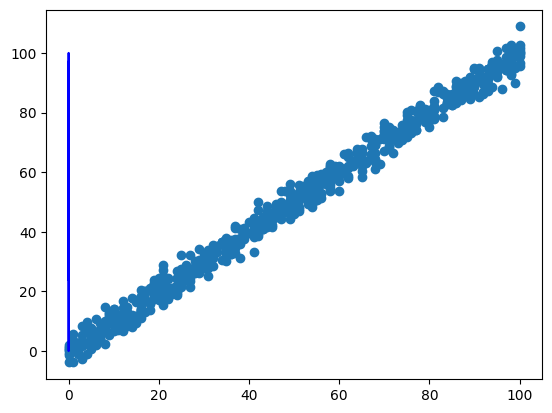

...

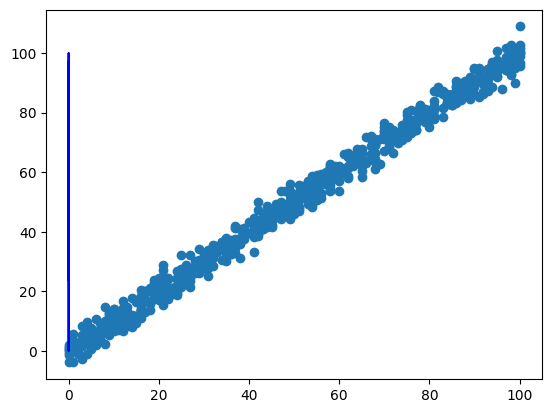

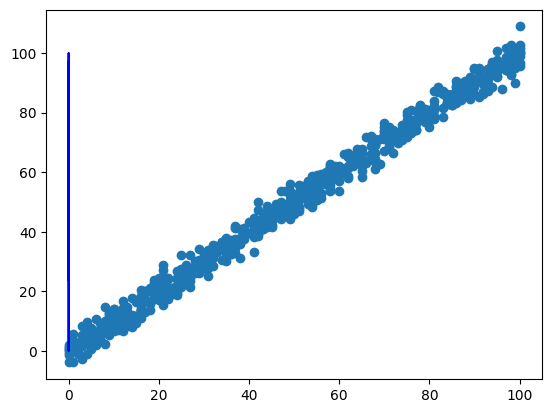

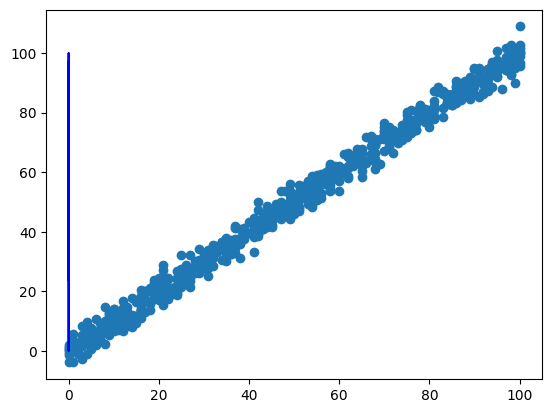

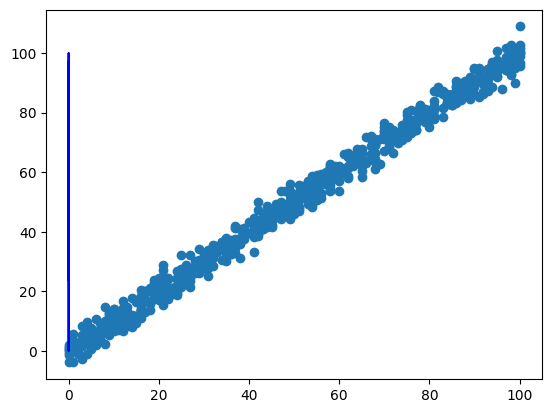

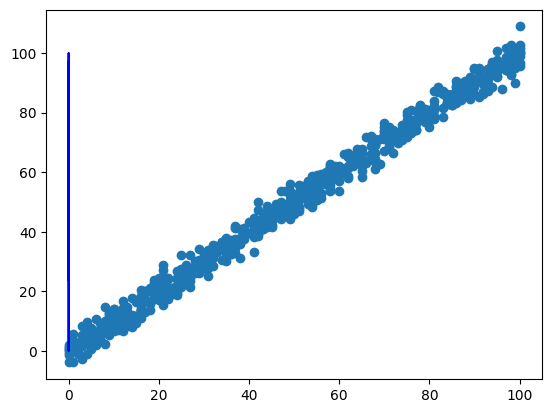

In [ ]:
alpha = 0.000000001
iters = 50
cost_values,theta_array = training(x_value,y_value,alpha,iters)

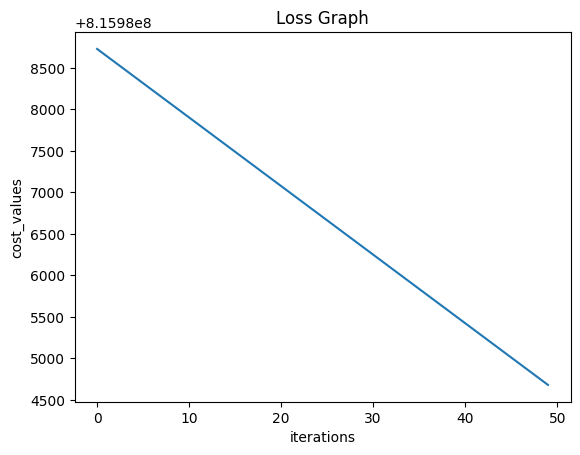

[np.float64(2.4969822859618305e-06), np.float64(5.7824480295354616e-06)] 12.0


In [ ]:
x_axis=np.arange(0,len(cost_values), step = 1)
plt.plot(x_axis, cost_values)
plt.xlabel('iterations')
plt.ylabel('cost_values')
plt.title('Loss Graph')
plt.show()

print(theta_array,12.0)

# **Sigmoid Function. Linear Neural Network**

In [ ]:
#import basic libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [ ]:
def sigmoid(x):
  return (1/(1+np.exp(-x)))

In [ ]:
x=np.linspace(-10,10,200)#-10 to 10, 200 samples
def plot_function(x,y,title):
  plt.plot(x,y,label=title)
  plt.title(title)
  plt.show()

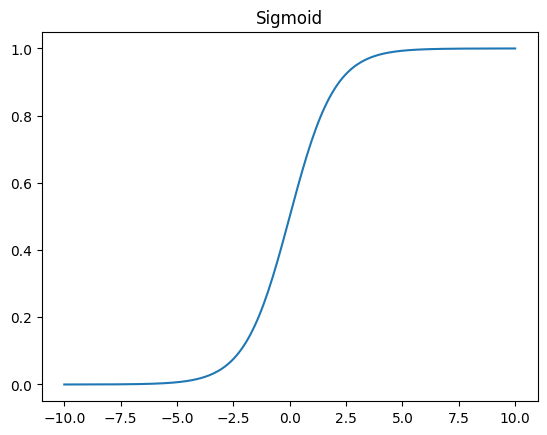

In [ ]:
plot_function(x,sigmoid(x),"Sigmoid")

In [ ]:
#step function
def stepfunction(x):
  return np.where(x>=0,1,0)

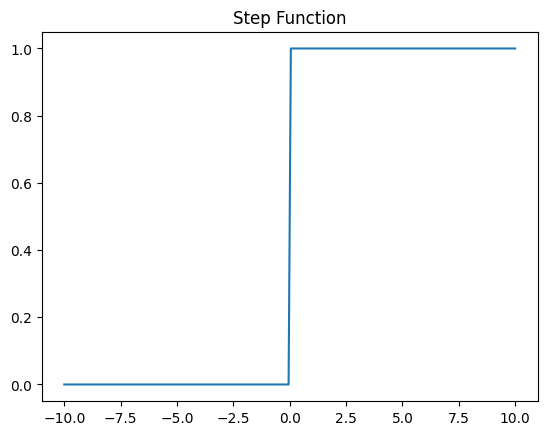

In [ ]:
plot_function(x,stepfunction(x),"Step Function")

In [ ]:
#ReLu(Rectified Linear Unit)
def ReLU(x):
  return np.maximum(0,x)

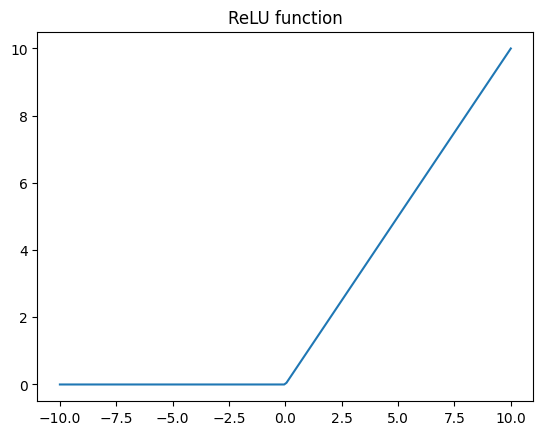

In [ ]:
plot_function(x,ReLU(x),"ReLU function")

In [ ]:
#Linear
def linear(x):
  return x

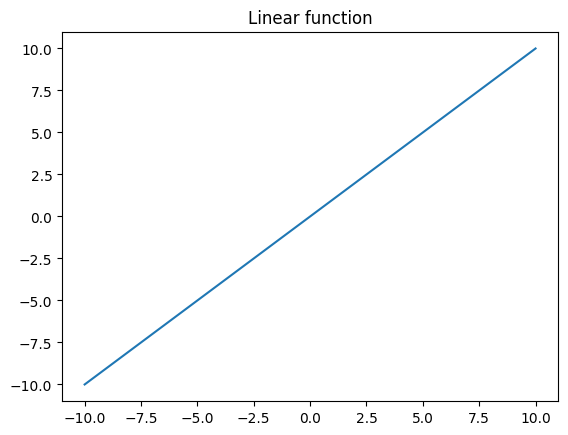

In [ ]:
plot_function(x,linear(x),"Linear function")

In [ ]:
def tanh(x):
  return (np.exp(x)-np.exp(-x))/(np.exp(x)+np.exp(-x))

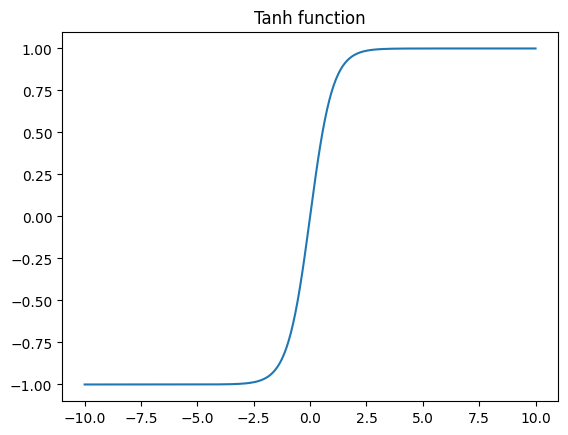

In [ ]:
plot_function(x,tanh(x),"Tanh function")

In [ ]:
def softmax(x):
  e1=np.exp(x-np.max(x))
  return e1/np.sum(e1,axis=0)

In [ ]:
z=np.array([0.90,0.40,0.10])
softmax(z)

array([0.48641453, 0.29502533, 0.21856014])

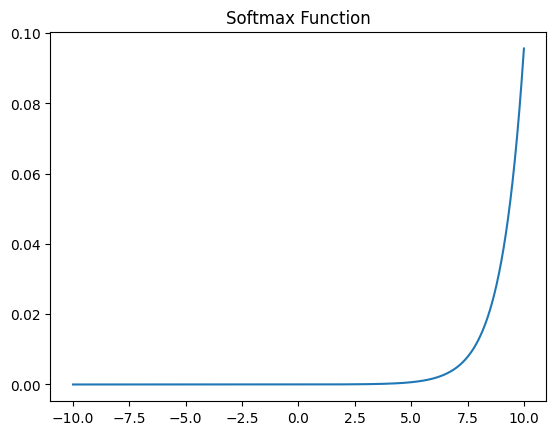

In [ ]:
plot_function(x,softmax(x),"Softmax Function")

# **Random Forest**

In [ ]:
#Decision tree is always overfitting, it can only follow the rules strictly. and for that reason we rely on random forest, that is a
#collection of trees

In [ ]:
from sklearn import datasets #loading dataset
iris = datasets.load_iris()

In [ ]:
iris

{'data': array([[5.1, 3.5, 1.4, 0.2],
        [4.9, 3. , 1.4, 0.2],
        [4.7, 3.2, 1.3, 0.2],
        [4.6, 3.1, 1.5, 0.2],
        [5. , 3.6, 1.4, 0.2],
        [5.4, 3.9, 1.7, 0.4],
        [4.6, 3.4, 1.4, 0.3],
        [5. , 3.4, 1.5, 0.2],
        [4.4, 2.9, 1.4, 0.2],
        [4.9, 3.1, 1.5, 0.1],
        [5.4, 3.7, 1.5, 0.2],
        [4.8, 3.4, 1.6, 0.2],
        [4.8, 3. , 1.4, 0.1],
        [4.3, 3. , 1.1, 0.1],
        [5.8, 4. , 1.2, 0.2],
        [5.7, 4.4, 1.5, 0.4],
        [5.4, 3.9, 1.3, 0.4],
        [5.1, 3.5, 1.4, 0.3],
        [5.7, 3.8, 1.7, 0.3],
        [5.1, 3.8, 1.5, 0.3],
        [5.4, 3.4, 1.7, 0.2],
        [5.1, 3.7, 1.5, 0.4],
        [4.6, 3.6, 1. , 0.2],
        [5.1, 3.3, 1.7, 0.5],
        [4.8, 3.4, 1.9, 0.2],
        [5. , 3. , 1.6, 0.2],
        [5. , 3.4, 1.6, 0.4],
        [5.2, 3.5, 1.5, 0.2],
        [5.2, 3.4, 1.4, 0.2],
        [4.7, 3.2, 1.6, 0.2],
        [4.8, 3.1, 1.6, 0.2],
        [5.4, 3.4, 1.5, 0.4],
        [5.2, 4.1, 1.5, 0.1],
  

In [ ]:
import pandas as pd
data = pd.DataFrame({"Sepal length": iris.data[:,0],
                     "Sepal width":iris.data[:,1],
                     "petal length":iris.data[:,2],
                     "petal width":iris.data[:,3],
                     "species":iris.target})

In [ ]:
data

,Sepal length,Sepal width,petal length,petal width,species
0,5.1,3.5,1.4,0.2,0
1,4.9,3.0,1.4,0.2,0
2,4.7,3.2,1.3,0.2,0
3,4.6,3.1,1.5,0.2,0
4,5.0,3.6,1.4,0.2,0
...,...,...,...,...,...
145,6.7,3.0,5.2,2.3,2
146,6.3,2.5,5.0,1.9,2
147,6.5,3.0,5.2,2.0,2
148,6.2,3.4,5.4,2.3,2


In [ ]:
#model training: train test splitting
from sklearn.model_selection import train_test_split
X = data[['Sepal length','Sepal width','petal length', 'petal width']]
y=data['species']
X_train, X_test,y_train, y_test = train_test_split(X,y,test_size=0.20, random_state=42)

In [ ]:
#model defination
from sklearn.ensemble import RandomForestClassifier
model=RandomForestClassifier(n_estimators=10)

In [ ]:
model.fit(X_train,y_train)

RandomForestClassifier(n_estimators=10)

In [ ]:
y_pred=model.predict(X_test)

In [ ]:
iris.target_names[0]

np.str_('setosa')

In [ ]:
from sklearn import metrics
metrics.accuracy_score(y_pred,y_test)

1.0

In [ ]:
#visualizing the trees
from sklearn.tree import export_graphviz
import pydot

In [ ]:
tree = model.estimators_[5]
export_graphviz(tree, out_file='/content/tree.dot',feature_names=iris.feature_names, rounded=True, precision=1)

In [ ]:
(graph,)=pydot.graph_from_dot_file('tree.dot')
graph.write_png("/content/tree.png")

# **SVM**

Accuracy: 1.0

Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        19
           1       1.00      1.00      1.00        13
           2       1.00      1.00      1.00        13

    accuracy                           1.00        45
   macro avg       1.00      1.00      1.00        45
weighted avg       1.00      1.00      1.00        45



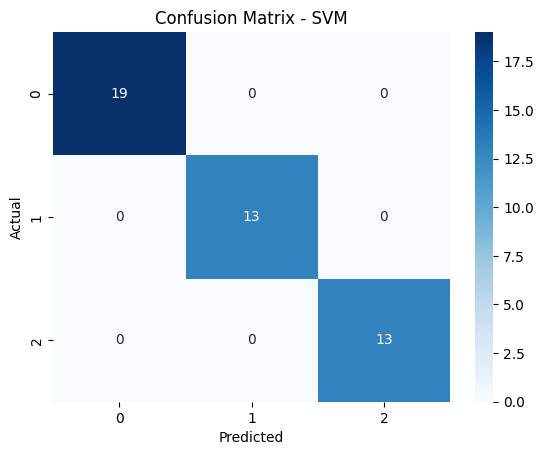

In [ ]:
# ------------------------------
# SVM Classification Example
# ------------------------------

import numpy as np
import matplotlib.pyplot as plt
from sklearn import datasets
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import seaborn as sns

# Load dataset
iris = datasets.load_iris()
X = iris.data
y = iris.target

# Split into train/test
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.3, random_state=42
)

# Standardize features (important for SVM!)
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# Train SVM model (RBF kernel - most common)
model = SVC(kernel='rbf', C=1.0, gamma='scale')
model.fit(X_train, y_train)

# Predict
y_pred = model.predict(X_test)

# Accuracy
acc = accuracy_score(y_test, y_pred)
print("Accuracy:", acc)

# Classification report
print("\nClassification Report:")
print(classification_report(y_test, y_pred))

# Confusion matrix
cm = confusion_matrix(y_test, y_pred)

sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")
plt.title("Confusion Matrix - SVM")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

# **Naive Bayes**

Accuracy: 0.9777777777777777

Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        19
           1       1.00      0.92      0.96        13
           2       0.93      1.00      0.96        13

    accuracy                           0.98        45
   macro avg       0.98      0.97      0.97        45
weighted avg       0.98      0.98      0.98        45



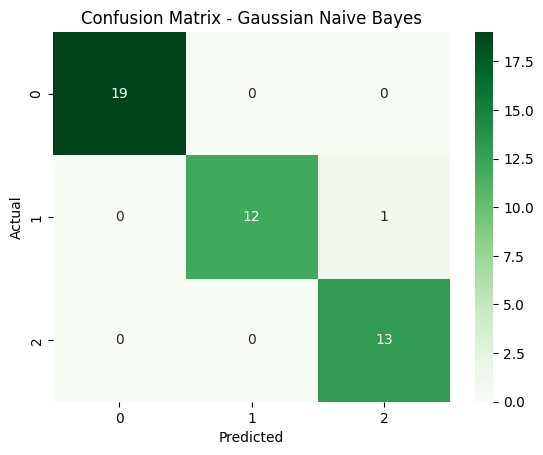

In [ ]:
# ------------------------------
# Naive Bayes Classification
# ------------------------------

import numpy as np
import matplotlib.pyplot as plt
from sklearn import datasets
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import seaborn as sns

# Load dataset
iris = datasets.load_iris()
X = iris.data
y = iris.target

# Split into train/test sets
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.3, random_state=42
)

# Standardization (optional for Naive Bayes, but often helps)
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# Naive Bayes model
model = GaussianNB()
model.fit(X_train, y_train)

# Predictions
y_pred = model.predict(X_test)

# Accuracy
acc = accuracy_score(y_test, y_pred)
print("Accuracy:", acc)

# Classification report
print("\nClassification Report:")
print(classification_report(y_test, y_pred))

# Confusion matrix
cm = confusion_matrix(y_test, y_pred)

sns.heatmap(cm, annot=True, fmt="d", cmap="Greens")
plt.title("Confusion Matrix - Gaussian Naive Bayes")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

# **CNN**

11490434/11490434 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


/usr/local/lib/python3.12/dist-packages/keras/src/layers/convolutional/base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/5
844/844 ━━━━━━━━━━━━━━━━━━━━ 46s 52ms/step - accuracy: 0.8707 - loss: 0.4218 - val_accuracy: 0.9820 - val_loss: 0.0582
Epoch 2/5
844/844 ━━━━━━━━━━━━━━━━━━━━ 43s 51ms/step - accuracy: 0.9811 - loss: 0.0591 - val_accuracy: 0.9877 - val_loss: 0.0468
Epoch 3/5
844/844 ━━━━━━━━━━━━━━━━━━━━ 44s 52ms/step - accuracy: 0.9875 - loss: 0.0411 - val_accuracy: 0.9878 - val_loss: 0.0380
Epoch 4/5
844/844 ━━━━━━━━━━━━━━━━━━━━ 84s 54ms/step - accuracy: 0.9903 - loss: 0.0286 - val_accuracy: 0.9908 - val_loss: 0.0357
Epoch 5/5
844/844 ━━━━━━━━━━━━━━━━━━━━ 44s 53ms/step - accuracy: 0.9935 - loss: 0.0193 - val_accuracy: 0.9912 - val_loss: 0.0308
313/313 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - accuracy: 0.9886 - loss: 0.0344
Test Accuracy: 0.9898999929428101


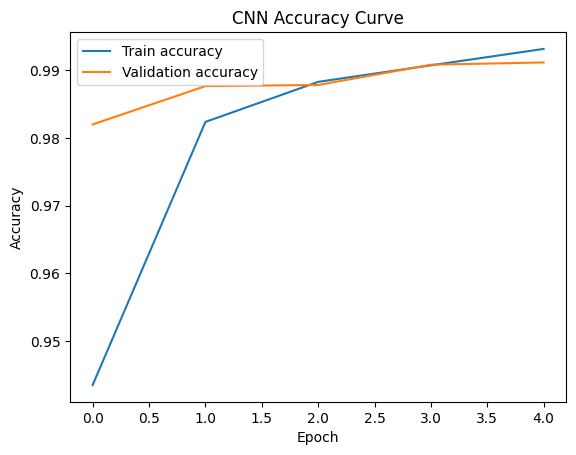

In [ ]:
# ---------------------------------------------------
# Convolutional Neural Network (CNN) - MNIST Dataset
# ---------------------------------------------------

import tensorflow as tf
from tensorflow.keras import datasets, layers, models
import matplotlib.pyplot as plt

# Load MNIST dataset
(X_train, y_train), (X_test, y_test) = datasets.mnist.load_data()

# Normalize (CNNs work better with normalized data)
X_train = X_train / 255.0
X_test = X_test / 255.0

# Reshape to add channel dimension (batch, height, width, channels)
X_train = X_train.reshape(-1, 28, 28, 1)
X_test = X_test.reshape(-1, 28, 28, 1)

# Build CNN model
model = models.Sequential([
    layers.Conv2D(32, (3,3), activation='relu', input_shape=(28, 28, 1)),
    layers.MaxPooling2D((2,2)),

    layers.Conv2D(64, (3,3), activation='relu'),
    layers.MaxPooling2D((2,2)),

    layers.Flatten(),
    layers.Dense(64, activation='relu'),
    layers.Dense(10, activation='softmax')   # 10 classes for digits 0–9
])

# Compile model
model.compile(
    optimizer='adam',
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

# Train the CNN
history = model.fit(
    X_train, y_train,
    epochs=5,
    batch_size=64,
    validation_split=0.1
)

# Test accuracy
test_loss, test_acc = model.evaluate(X_test, y_test)
print("Test Accuracy:", test_acc)

# Plot accuracy curve
plt.plot(history.history['accuracy'], label='Train accuracy')
plt.plot(history.history['val_accuracy'], label='Validation accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.title("CNN Accuracy Curve")
plt.show()

# **LSTM**

/usr/local/lib/python3.12/dist-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/20
11/11 ━━━━━━━━━━━━━━━━━━━━ 9s 148ms/step - loss: 0.5057 - val_loss: 0.4253
Epoch 2/20
11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 58ms/step - loss: 0.3218 - val_loss: 0.2049
Epoch 3/20
11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 79ms/step - loss: 0.1219 - val_loss: 0.0051
Epoch 4/20
11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 64ms/step - loss: 0.0157 - val_loss: 0.0025
Epoch 5/20
11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0029 - val_loss: 0.0065
Epoch 6/20
11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 101ms/step - loss: 0.0031 - val_loss: 5.5537e-04
Epoch 7/20
11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 7.4945e-04 - val_loss: 7.3264e-05
Epoch 8/20
11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 1.0403e-04 - val_loss: 2.1215e-04
Epoch 9/20
11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 45ms/step - loss: 1.0687e-04 - val_loss: 7.3270e-05
Epoch 10/20
11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 64ms/step - loss: 5.3301e-05 - val_loss: 2.5416e-05
Epoch 11/20
11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 2.4941e-05 - val_loss: 1.4357e-05
Epoch 12/20
11/11

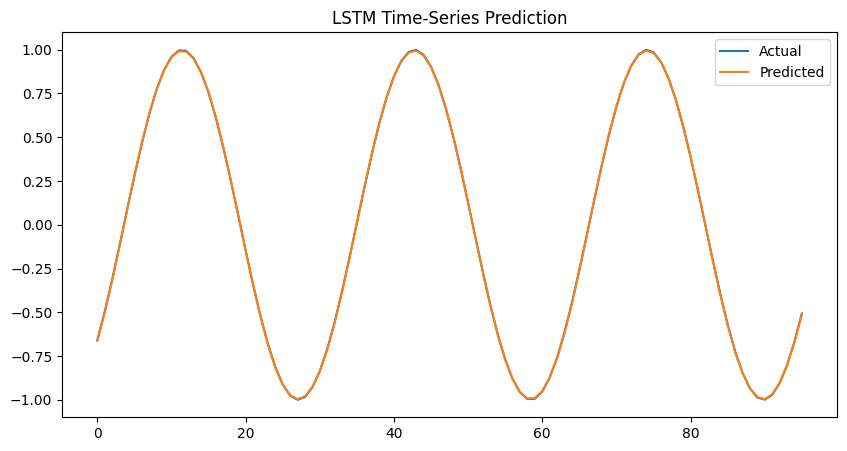

In [ ]:
# ---------------------------------------------------
# LSTM for Time Series Prediction (Sine Wave Example)
# ---------------------------------------------------

import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense

# 1) Generate synthetic time-series data (sine wave)
x = np.linspace(0, 100, 500)
y = np.sin(x)

# 2) Prepare sequences for LSTM
def create_sequences(data, seq_len=20):
    X, y = [], []
    for i in range(len(data) - seq_len):
        X.append(data[i:i+seq_len])
        y.append(data[i+seq_len])
    return np.array(X), np.array(y)

seq_length = 20
X, y = create_sequences(y, seq_length)

# Reshape input to: (samples, time_steps, features)
X = X.reshape((X.shape[0], X.shape[1], 1))

# Train-test split
train_size = int(0.8 * len(X))
X_train, X_test = X[:train_size], X[train_size:]
y_train, y_test = y[:train_size], y[train_size:]

# 3) Build the LSTM model
model = Sequential([
    LSTM(50, return_sequences=False, input_shape=(seq_length, 1)),
    Dense(1)
])

model.compile(optimizer='adam', loss='mse')

# 4) Train the model
history = model.fit(
    X_train, y_train,
    epochs=20,
    batch_size=32,
    validation_split=0.1,
    verbose=1
)

# 5) Make predictions
y_pred = model.predict(X_test)

# 6) Plot predictions vs actual values
plt.figure(figsize=(10, 5))
plt.plot(y_test, label="Actual")
plt.plot(y_pred, label="Predicted")
plt.legend()
plt.title("LSTM Time-Series Prediction")
plt.show()

# **Kernel based Image Filtering**

Saving black cat.jpeg to black cat.jpeg


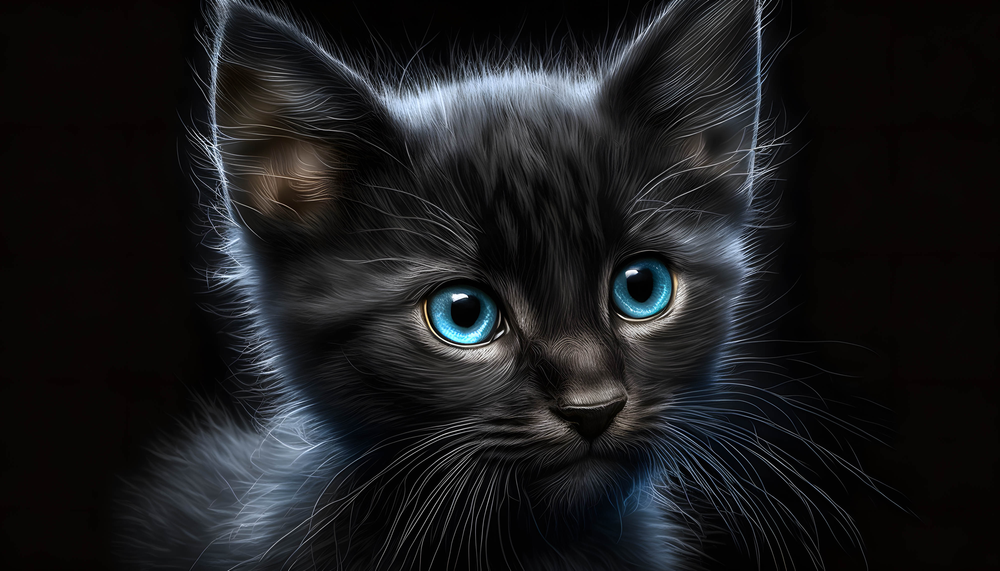

Original Image Loaded


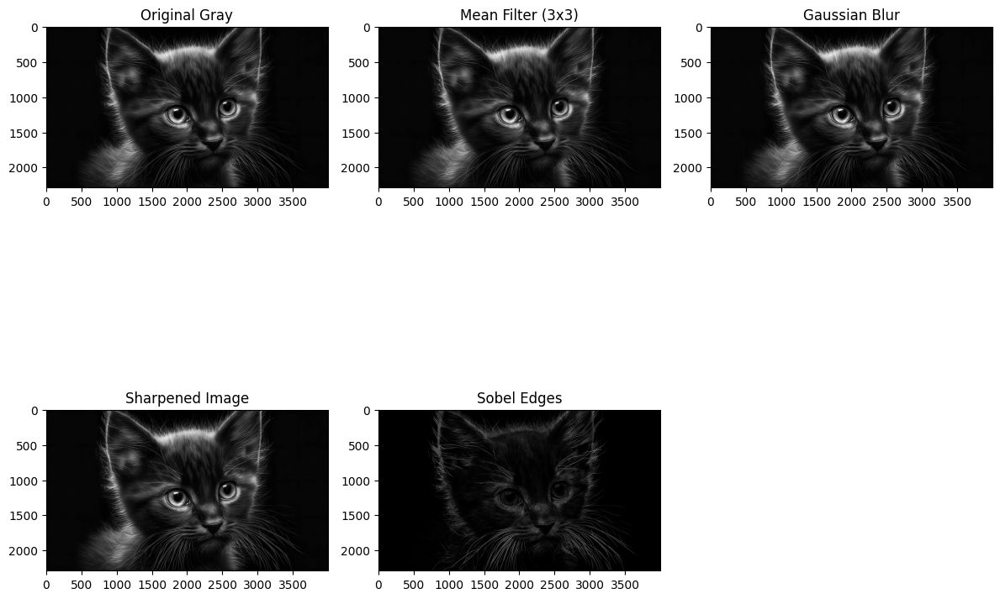

In [ ]:
# -----------------------------------------------------------
# Kernel-Based Image Filtering (Smoothing, Sharpening, Edges)
# -----------------------------------------------------------

import cv2
import numpy as np
from google.colab.patches import cv2_imshow
import matplotlib.pyplot as plt

# Load image (upload first or use your own path)
from google.colab import files
uploaded = files.upload()

# Auto detect filename
filename = list(uploaded.keys())[0]
image = cv2.imread(filename)
image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

cv2_imshow(image)
print("Original Image Loaded")

# ---------------------------
# 1. Mean (Averaging) Filter
# ---------------------------
kernel_mean = np.ones((3,3), np.float32) / 9
mean_filtered = cv2.filter2D(image_gray, -1, kernel_mean)

# ---------------------------
# 2. Gaussian Blur
# ---------------------------
gaussian_filtered = cv2.GaussianBlur(image_gray, (5,5), 1)

# ---------------------------
# 3. Sharpening Filter
# ---------------------------
kernel_sharpen = np.array([
    [0, -1, 0],
    [-1, 5,-1],
    [0, -1, 0]
])
sharpened = cv2.filter2D(image_gray, -1, kernel_sharpen)

# ---------------------------
# 4. Edge Detection (Sobel)
# ---------------------------
edge_x = cv2.Sobel(image_gray, cv2.CV_64F, 1, 0, ksize=3)
edge_y = cv2.Sobel(image_gray, cv2.CV_64F, 0, 1, ksize=3)
sobel_edges = cv2.magnitude(edge_x, edge_y)

# ---------------------------
# Display Results
# ---------------------------

plt.figure(figsize=(12, 10))

plt.subplot(2, 3, 1)
plt.imshow(image_gray, cmap='gray')
plt.title("Original Gray")

plt.subplot(2, 3, 2)
plt.imshow(mean_filtered, cmap='gray')
plt.title("Mean Filter (3x3)")

plt.subplot(2, 3, 3)
plt.imshow(gaussian_filtered, cmap='gray')
plt.title("Gaussian Blur")

plt.subplot(2, 3, 4)
plt.imshow(sharpened, cmap='gray')
plt.title("Sharpened Image")

plt.subplot(2, 3, 5)
plt.imshow(sobel_edges, cmap='gray')
plt.title("Sobel Edges")

plt.tight_layout()
plt.show()

# **Decision Tree**